In [83]:
# Firstly, we import necessary packages
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os

from aggrigator.uncertainty_maps import UncertaintyMap
from aggrigator.methods import AggregationMethods as am
from aggrigator.summary import AggregationSummary
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [91]:
def norm_factor(file, uq_method, task):
    if "softmax" in file:
        return 1
    if task == "semantic":
        return 1 / np.log(7)
    else:
        return 1 / np.log(3) # 3-class FG-BG-Segmentation
    

def get_lizard_arrays(dir, uq_method="pu", task="semantic", uq_model="dropout"):
    # Load arrays
    path = os.path.join(os.getcwd(), "..", "..", "data", dir)
    files = os.listdir(path)
    # Filter files by UQ method and segmentation task
    def norm_factor(file, task):
        if "softmax" in file:
            return 1
        return 1 / np.log(7) if task == "semantic" else 1 / np.log(3)
    arrays = [np.load(os.path.join(path, file))*norm_factor(file, task) for file in files if uq_method in file and task in file and uq_model in file] # 3D arrays, shape (50,512,512)
    num_slices = arrays[0].shape[0]
    arrays = [array[slice,:,:] for array in arrays for slice in range(num_slices)]
    arrays = [np.where(array < 0, 0, array) for array in arrays]
    # # Uniformly scale by ln(K) where K is number of classes
    # # 7 for Lizard: Background, Neutrophils, LYM, PLA, EPI, EOS, FIB 
    # if task == "semantic":
    #     arrays /= np.log(7)
    # else:
    #     arrays /= np.log(3) # 3-class FG-BG-Segmentation
    files = [f"{file}_{slice}" for file in files for slice in range(num_slices)]
    return arrays, files

def get_arctique_arrays(dir, uq_method="pu", task="semantic", noise_level="0_00", uq_model="dropout"):
    # Load arrays
    path = os.path.join(os.getcwd(), "..", "..", "data", dir)
    files = os.listdir(path)
    # Filter files by UQ method and segmentation task and noise level
    def norm_factor(file, task):
        if "softmax" in file:
            return 1
        return 1 / np.log(6) if task == "semantic" else 1 / np.log(3)
    arrays = [np.load(os.path.join(path, file))*norm_factor(file, task) for file in files if uq_method in file and task in file and noise_level in file and uq_model in file] # 3D arrays, shape (50,512,512)
    num_slices = arrays[0].shape[0]
    arrays = [array[slice,:,:] for array in arrays for slice in range(num_slices)]
    arrays = [np.where(array < 0, 0, array) for array in arrays]
    # # Uniformly scale by ln(K) where K is number of classes
    # # 6 for Arctique: Background, LYM, PLA, EPI, EOS, FIB 
    # if task == "semantic":
    #     arrays /= np.log(6)
    # else:
    #     arrays /= np.log(3)
    files = [f"{file}_{slice}" for file in files for slice in range(num_slices)]
    return arrays, files

def get_crops_arrays(dir):
    path = os.path.join(os.getcwd(), "..", "..", "data", dir)
    files = os.listdir(path)
    arrays = [np.load(os.path.join(path, file)) for file in files] # 2D arrays
    arrays = [np.where(array < 0, 0, array) for array in arrays]
    return arrays, files

def plot_correlation_matrix(df, title):
    """
    Computes and plots the correlation matrix of methods across columns.

    :param df: pandas DataFrame where each row represents a method and columns represent features.
    """
    # Compute the correlation matrix (rows as methods, columns as features)
    corr_matrix = df[df.columns.tolist()[1:]].T.corr(min_periods=1)

    # Plot the correlation matrix as a heatmap
    plt.figure(figsize=(8, 6))
    #sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
    sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5, 
                xticklabels=df["Name"].tolist(), yticklabels=df["Name"].tolist(), vmin=-1, vmax=1)  # Show row names

    plt.title(title)
    plt.show()

def plot_correlations(summary_dfs, colorbox=False):
    corr_matrices = {dataset : df[df.columns.tolist()[1:]].T.corr(min_periods=1) for dataset, df in summary_dfs.items()}
    datasets = list(corr_matrices.keys())
    dfs = [df for df in summary_dfs.values()]

    N = len(corr_matrices)  # Number of matrices
    fig, axes = plt.subplots(1, N, figsize=(10 * N, 10))  # Create horizontal subplots

    if N == 1:
        axes = [axes]  # Ensure axes is iterable if only one matrix

    for i, (ax, dataset) in enumerate(zip(axes, datasets)):
        strategy_names = [df["Name"].tolist() for df in dfs]
        sns.heatmap(corr_matrices[dataset], ax=ax, cmap="coolwarm", annot=False, fmt=".2f", cbar=True, vmin=-1, vmax=1,
                    xticklabels=strategy_names[i])
        ax.set_yticks([])
        ax.set_title(f"{dataset}: Method correlation")

        if colorbox:
            # unique_groups = list(dict.fromkeys(groups))  # Get unique groups in order
            # group_colors = ["#FFD700", "#87CEEB", "#90EE90"]  # Colors for each group (Yellow, Sky Blue, Green)
            # # Apply background color to x-tick labels
            # for tick, label in zip(ax.get_xticklabels(), groups):
            #     tick.set_bbox(dict(facecolor=group_colors[unique_groups.index(label)], edgecolor='none', alpha=0.5, boxstyle="round,pad=0.3"))
            #         # Apply background color to x-tick labels
            color_code = {
                "threshold" : "red",
                "quantile" : "green",
                "patch" : "blue"
            }
            for tick in ax.get_xticklabels():
                strategy_name = tick.get_text()
                color = next((color_code[key] for key in color_code if key in strategy_name), "black")
                tick.set_bbox(dict(facecolor=color, edgecolor='none', alpha=0.5, boxstyle="round,pad=0.3"))
        

    plt.tight_layout()
    plt.show()
    return corr_matrices

def correlation_matrix_to_excel(df, title):
    # Compute the correlation matrix (rows as methods, columns as features)
    method_columns = df.columns.tolist()[1:]
    corr_matrix = df[method_columns].T.corr(min_periods=1)
    # Change index and columns names to method_columns
    corr_matrix.columns = [strat for strat in df["Name"].tolist()]
    corr_matrix.index = [strat for strat in df["Name"].tolist()]
    # save to excel
    corr_matrix.to_excel(os.path.join(os.getcwd(), "..", "..", "output", f"correlation_matrix_{title}.xlsx"))



In [92]:
focus_strategy_list = [
    (am.mean, None),
    (am.above_threshold_mean, 0.3),
    (am.above_threshold_mean, 0.5),
    (am.above_threshold_mean, 0.7),
    (am.above_threshold_mean, 0.9),
    (am.above_threshold_mean, 0.95),
    (am.above_quantile_mean, 0.3),
    (am.above_quantile_mean, 0.5),
    (am.above_quantile_mean, 0.7),
    (am.above_quantile_mean, 0.9),
    (am.above_quantile_mean, 0.95),
    (am.patch_aggregation, 10), 
    (am.patch_aggregation, 20),
    (am.patch_aggregation, 40),
    (am.patch_aggregation, 80),
    (am.patch_aggregation, 100),
    (am.patch_aggregation, 200),
]

# Filter Lizard and Arctique by UQ method and task
UQ_METHOD = "pu"
TASK = "semantic"
LIZARD_DIR = "lizard_unnormalized_noncal_uq_maps"
ARCTIQUE_DIR = "arctique_unnormalized_noncal_uq_maps"
CROPS_DIR = "crops_uq_maps"
NOISE_LEVEL = "0_00"


# Get lizard dataset
lizard_arrays, lizard_filenames = get_lizard_arrays(LIZARD_DIR, UQ_METHOD, TASK)
lizard_maps = [UncertaintyMap(array=array, mask=None, name=name) for array, name in zip(lizard_arrays, lizard_filenames)]
lizard_summary = AggregationSummary(focus_strategy_list, name=f"lizard_overview", num_cpus=12)
lizard_df = lizard_summary.apply_methods(lizard_maps, save_to_excel=False, do_plot=False, max_value=1.0)

# Get crops dataset
crops_arrays, crops_filenames = get_crops_arrays(CROPS_DIR)
crops_maps = [UncertaintyMap(array=array, mask=None, name=name) for array, name in zip(crops_arrays, crops_filenames)]
crops_summary = AggregationSummary(focus_strategy_list, name=f"lizard_overview", num_cpus=12)
crops_df = crops_summary.apply_methods(crops_maps, save_to_excel=False, do_plot=False, max_value=1.0)

# Get arctique dataset
arctique_arrays, arctique_filenames = get_arctique_arrays(ARCTIQUE_DIR, UQ_METHOD, TASK, NOISE_LEVEL)
arctique_maps = [UncertaintyMap(array=array, mask=None, name=name) for array, name in zip(arctique_arrays, arctique_filenames)]
arctique_summary = AggregationSummary(focus_strategy_list, name=f"actique_overview", num_cpus=12)
arctique_df = arctique_summary.apply_methods(arctique_maps, save_to_excel=False, do_plot=False, max_value=1.0)


Using 8 CPUs.
Using 8 CPUs.
Using 8 CPUs.


In [80]:
arctique_max = max([np.max(arr) for arr in arctique_arrays])
lizard_max = max([np.max(arr) for arr in lizard_arrays])
crops_max = max([np.max(arr) for arr in crops_arrays])

print(f"Arctique (max normalized): {arctique_max} of 1.0")
print(f"Lizard (max normalized): {lizard_max} of 1.0")
print(f"Crops: {crops_max} of max entropy: TODO")

Arctique (max normalized): 0.8943035606473592 of 1.0
Lizard (max normalized): 0.9645630996432235 of 1.0
Crops: 1.098597764968872 of max entropy: TODO


In [93]:
[np.max(array) for array in arctique_arrays]

[np.float64(0.9080198279632596),
 np.float64(0.8186349229296614),
 np.float64(0.7744875003216039),
 np.float64(0.8420712090055439),
 np.float64(0.9712432973772681),
 np.float64(0.8774981530737382),
 np.float64(0.8856736017048601),
 np.float64(0.9091098877807425),
 np.float64(0.8257203117433003),
 np.float64(0.8742279736212896),
 np.float64(0.8044641453023836),
 np.float64(0.8851285717961186),
 np.float64(0.8992993494233964),
 np.float64(0.8546068969065973),
 np.float64(0.8633273754464605),
 np.float64(0.8676876147163921),
 np.float64(0.8529718071803729),
 np.float64(0.8404361192793195),
 np.float64(0.8736829437125482),
 np.float64(0.8475215080929585),
 np.float64(0.772307380686638),
 np.float64(0.8840385119786357),
 np.float64(0.9052946784195524),
 np.float64(0.8486115679104413),
 np.float64(0.8753180334387725),
 np.float64(0.8219051023821101),
 np.float64(0.8202700126558858),
 np.float64(0.8905788708835332),
 np.float64(0.834985820191905),
 np.float64(0.8834934820698943),
 np.float64(

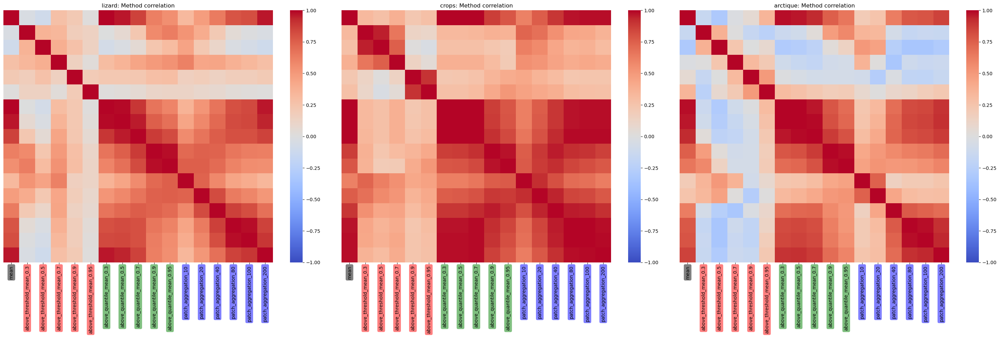

[[ 1.         -0.03268487 -0.09751615  0.27468348  0.21855783  0.01158827
   0.99420691  0.96218411  0.8548582   0.61802219  0.55145732  0.32277987
   0.47920648  0.63783542  0.79300492  0.82006088  0.96471418]
 [-0.03268487  1.          0.36184851  0.34227326  0.17743137  0.14330799
  -0.00308163  0.0669324   0.22846153  0.57282032  0.62869771  0.52615875
   0.40472265  0.21190858  0.04091733 -0.007909   -0.03616083]
 [-0.09751615  0.36184851  1.          0.38368975  0.26677568  0.1479115
  -0.07385529 -0.0291503   0.05417506  0.23840245  0.30793923  0.44797806
   0.22177452  0.10699623 -0.02834545 -0.06835011 -0.10428724]
 [ 0.27468348  0.34227326  0.38368975  1.          0.1498777   0.02505882
   0.30254666  0.35309725  0.43974322  0.49608383  0.53833102  0.61026033
   0.43226397  0.43751918  0.36913054  0.33162874  0.28269796]
 [ 0.21855783  0.17743137  0.26677568  0.1498777   1.          0.19902926
   0.21887627  0.22287255  0.23238744  0.28334026  0.2957502   0.1585454
   0.18735

In [94]:
summary_dfs = {"lizard": lizard_df, "crops": crops_df, "arctique": arctique_df}
corr_matrices = plot_correlations(summary_dfs, colorbox=True)

for m in corr_matrices.values():
    # Print if value is negative:
    print(m.values)

In [95]:
correlation_matrix_to_excel(lizard_df, "lizard")
correlation_matrix_to_excel(crops_df, "crops")
correlation_matrix_to_excel(arctique_df, "arctique")


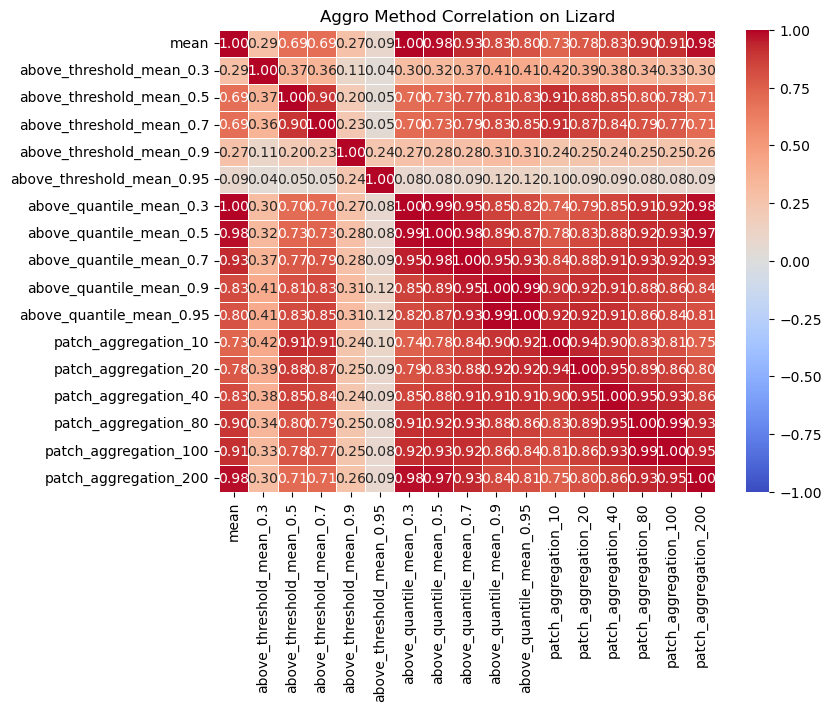

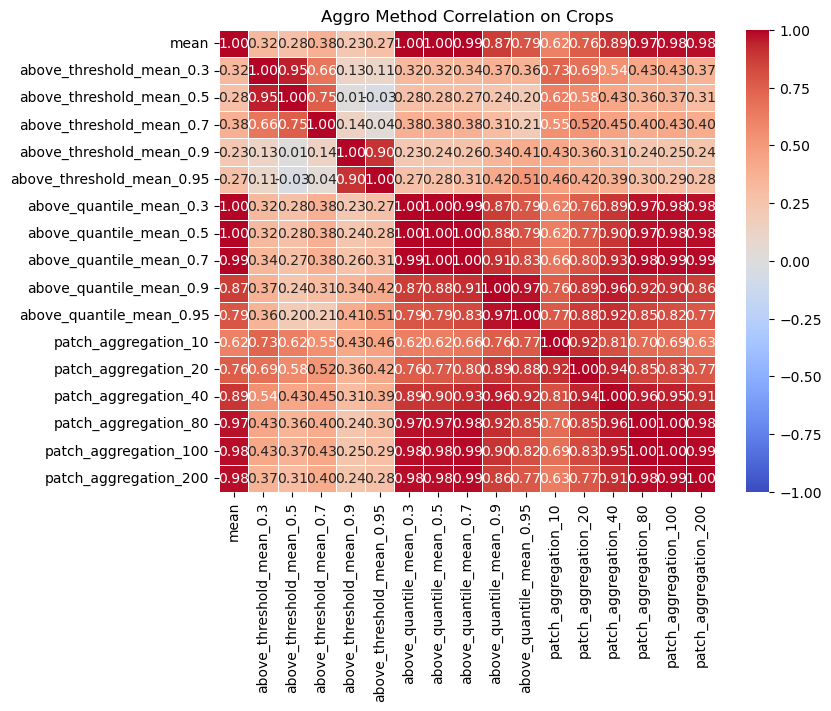

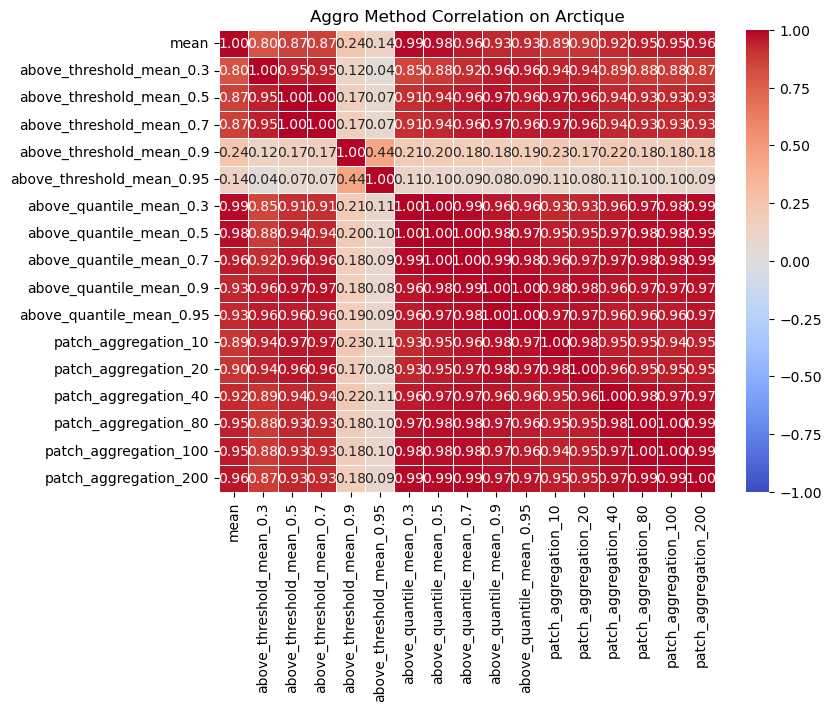

In [53]:
lizard_matrix = plot_correlation_matrix(lizard_df, "Aggro Method Correlation on Lizard")
crop_matrix = plot_correlation_matrix(crops_df, "Aggro Method Correlation on Crops")
arctique_matrix = plot_correlation_matrix(arctique_df, "Aggro Method Correlation on Arctique")

In [ ]:


# Get lizard dataset
lizard_arrays, lizard_filenames = get_lizard_arrays()
lizard_maps = [UncertaintyMap(array=array, mask=None, name=name) for array, name in zip(lizard_arrays, lizard_filenames)]
lizard_summary = AggregationSummary(focus_strategy_list, name=f"lizard_overview", num_cpus=12)
lizard_df = lizard_summary.apply_methods(lizard_maps, save_to_excel=False, do_plot=False, max_value=1.0)

# Get crops dataset
crops_arrays, crops_filenames = get_crops_arrays()

crops_maps = [UncertaintyMap(array=array, mask=None, name=name) for array, name in zip(crops_arrays, crops_filenames)]
crops_summary = AggregationSummary(focus_strategy_list, name=f"lizard_overview", num_cpus=12)
crops_df = crops_summary.apply_methods(crops_maps, save_to_excel=False, do_plot=False, max_value=1.0)

# Get arctique dataset
arctique_arrays, arctique_filenames = get_arctique_arrays()
arctique_maps = [UncertaintyMap(array=array, mask=None, name=name) for array, name in zip(arctique_arrays, arctique_filenames)]
arctique_summary = AggregationSummary(focus_strategy_list, name=f"actique_overview", num_cpus=12)
arctique_df = arctique_summary.apply_methods(arctique_maps, save_to_excel=False, do_plot=False, max_value=1.0)


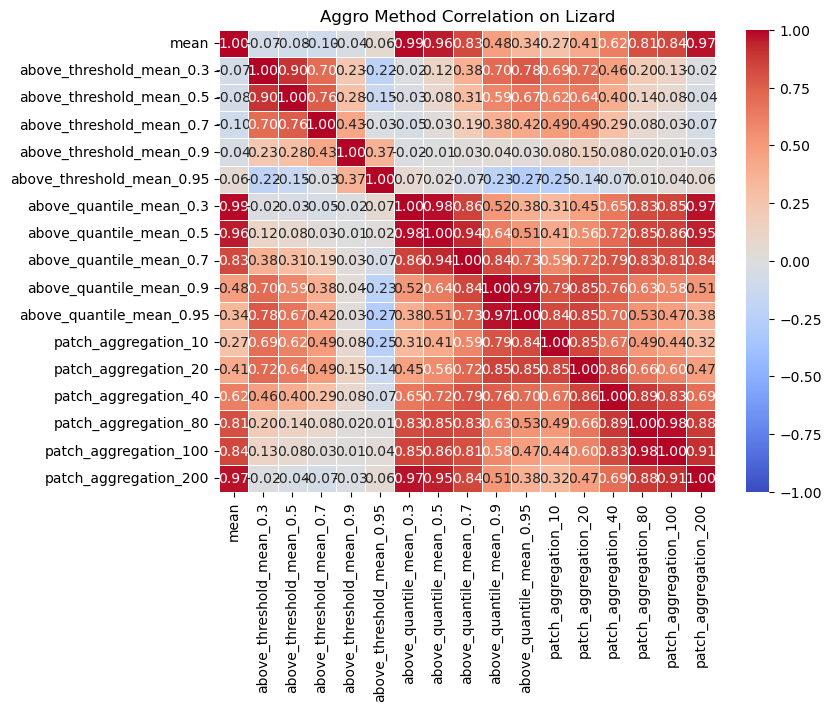

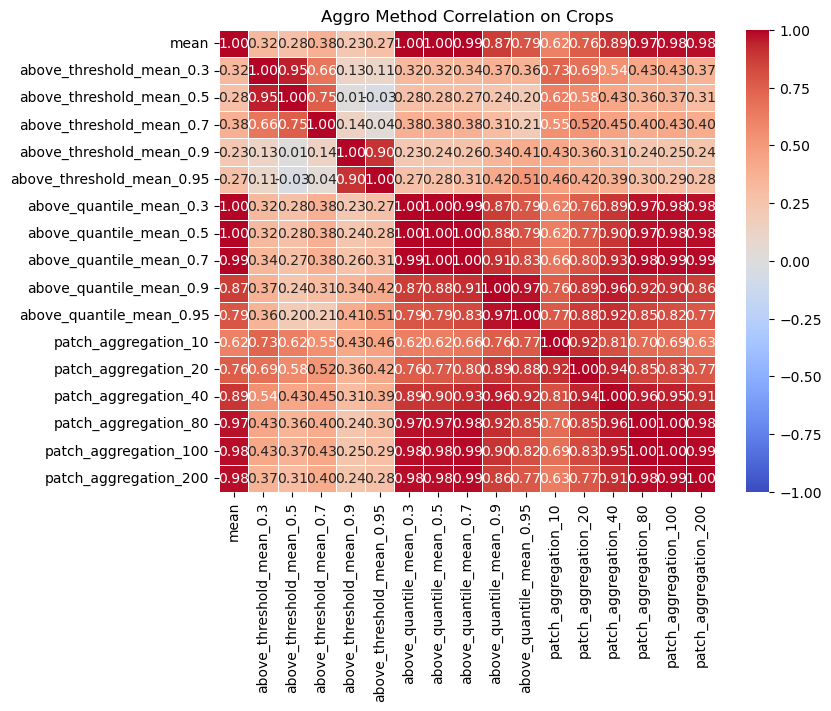

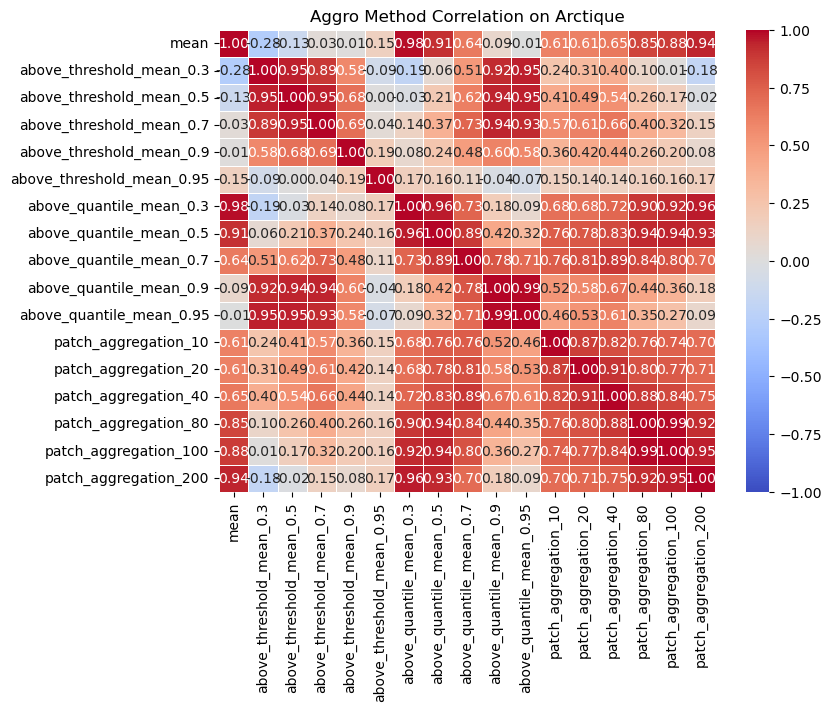

In [10]:
lizard_matrix = plot_correlation_matrix(lizard_df, "Aggro Method Correlation on Lizard")
crop_matrix = plot_correlation_matrix(crops_df, "Aggro Method Correlation on Crops")
arctique_matrix = plot_correlation_matrix(arctique_df, "Aggro Method Correlation on Arctique")


In [ ]:
def plot_correlations(summary_dfs, colorbox=False):
    corr_matrices = {dataset : df[df.columns.tolist()[1:]].T.corr(min_periods=1) for dataset, df in summary_dfs.items()}
    datasets = list(corr_matrices.keys())
    dfs = [df for df in summary_dfs.values()]

    N = len(corr_matrices)  # Number of matrices
    fig, axes = plt.subplots(1, N, figsize=(10 * N, 10))  # Create horizontal subplots

    if N == 1:
        axes = [axes]  # Ensure axes is iterable if only one matrix

    for i, (ax, dataset) in enumerate(zip(axes, datasets)):
        strategy_names = [df["Name"].tolist() for df in dfs]
        sns.heatmap(corr_matrices[dataset], ax=ax, cmap="coolwarm", annot=False, fmt=".2f", cbar=True, vmin=-1, vmax=1,
                    xticklabels=strategy_names[i])
        ax.set_yticks([])
        ax.set_title(f"{dataset}: Method correlation")

        if colorbox:
            # unique_groups = list(dict.fromkeys(groups))  # Get unique groups in order
            # group_colors = ["#FFD700", "#87CEEB", "#90EE90"]  # Colors for each group (Yellow, Sky Blue, Green)
            # # Apply background color to x-tick labels
            # for tick, label in zip(ax.get_xticklabels(), groups):
            #     tick.set_bbox(dict(facecolor=group_colors[unique_groups.index(label)], edgecolor='none', alpha=0.5, boxstyle="round,pad=0.3"))
            #         # Apply background color to x-tick labels
            color_code = {
                "threshold" : "red",
                "quantile" : "green",
                "patch" : "blue"
            }
            for tick in ax.get_xticklabels():
                strategy_name = tick.get_text()
                color = next((color_code[key] for key in color_code if key in strategy_name), "black")
                tick.set_bbox(dict(facecolor=color, edgecolor='none', alpha=0.5, boxstyle="round,pad=0.3"))
        

    plt.tight_layout()
    plt.show()
    return corr_matrices

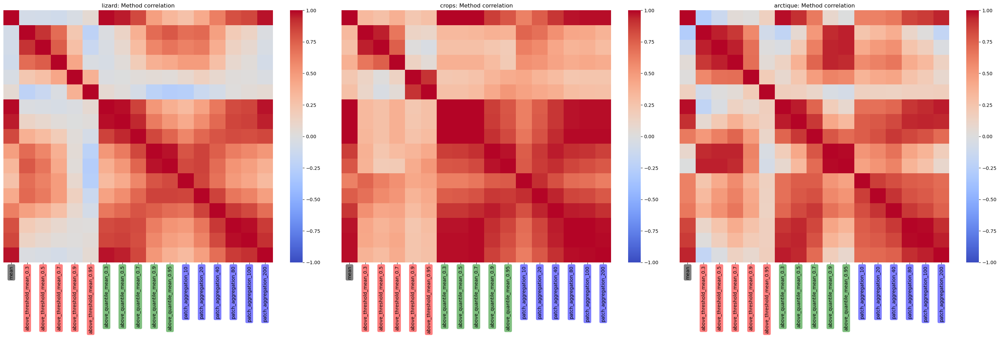

True

In [17]:
# Plot correlation of given datasets and strategy list next to one


summary_dfs = {"lizard": lizard_df, "crops": crops_df, "arctique": arctique_df}



plot_correlations(summary_dfs, colorbox=True)
True

## Epistemic uncertainty

Using 8 CPUs.
Using 8 CPUs.
Using 8 CPUs.


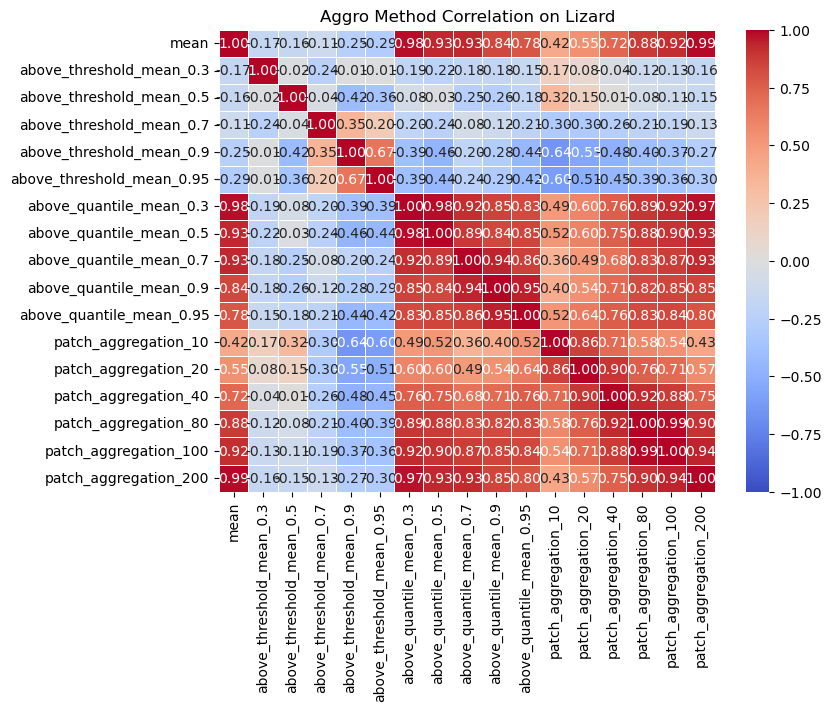

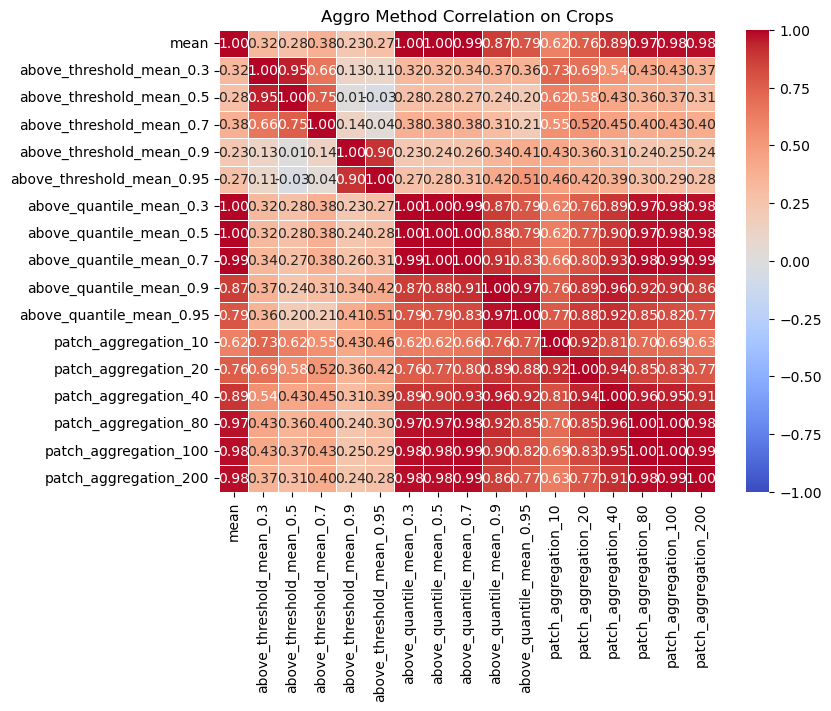

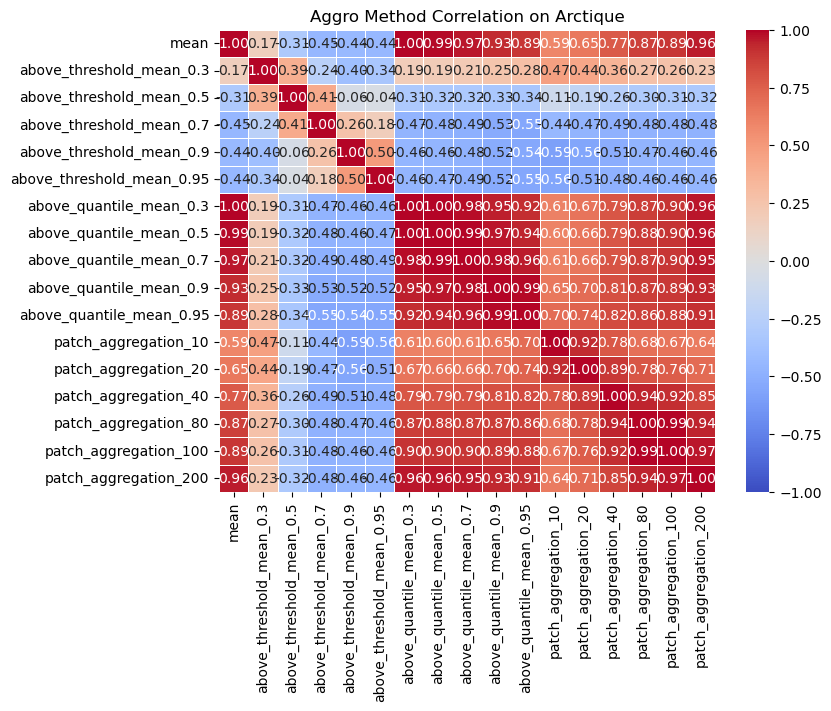

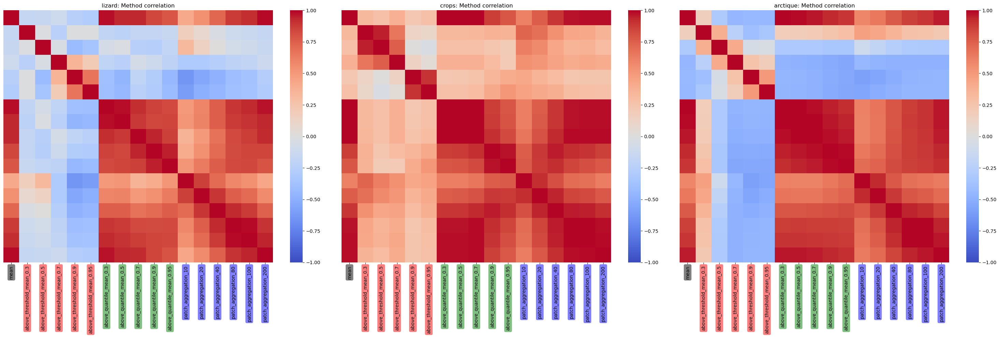

{'lizard':           0         1         2         3         4         5         6   \
 0   1.000000 -0.167781 -0.156618 -0.112174 -0.251011 -0.288619  0.978807   
 1  -0.167781  1.000000 -0.022878 -0.237639 -0.010694 -0.011091 -0.193940   
 2  -0.156618 -0.022878  1.000000 -0.040900 -0.416660 -0.357420 -0.076038   
 3  -0.112174 -0.237639 -0.040900  1.000000  0.351760  0.197089 -0.198903   
 4  -0.251011 -0.010694 -0.416660  0.351760  1.000000  0.667958 -0.388079   
 5  -0.288619 -0.011091 -0.357420  0.197089  0.667958  1.000000 -0.392596   
 6   0.978807 -0.193940 -0.076038 -0.198903 -0.388079 -0.392596  1.000000   
 7   0.934173 -0.222674 -0.029083 -0.240252 -0.462724 -0.443152  0.979634   
 8   0.931210 -0.178222 -0.253680 -0.076972 -0.199919 -0.235950  0.915913   
 9   0.841936 -0.176996 -0.264870 -0.120921 -0.276372 -0.293017  0.852065   
 10  0.782268 -0.150816 -0.179720 -0.211704 -0.437747 -0.420328  0.830590   
 11  0.417167  0.166068  0.322239 -0.303982 -0.644648 -0.602667  0

In [20]:
focus_strategy_list = [
    (am.mean, None),
    (am.above_threshold_mean, 0.3),
    (am.above_threshold_mean, 0.5),
    (am.above_threshold_mean, 0.7),
    (am.above_threshold_mean, 0.9),
    (am.above_threshold_mean, 0.95),
    (am.above_quantile_mean, 0.3),
    (am.above_quantile_mean, 0.5),
    (am.above_quantile_mean, 0.7),
    (am.above_quantile_mean, 0.9),
    (am.above_quantile_mean, 0.95),
    (am.patch_aggregation, 10), 
    (am.patch_aggregation, 20),
    (am.patch_aggregation, 40),
    (am.patch_aggregation, 80),
    (am.patch_aggregation, 100),
    (am.patch_aggregation, 200),
]


# Get lizard dataset
lizard_arrays, lizard_filenames = get_lizard_arrays("eu")
lizard_maps = [UncertaintyMap(array=array, mask=None, name=name) for array, name in zip(lizard_arrays, lizard_filenames)]
lizard_summary = AggregationSummary(focus_strategy_list, name=f"lizard_overview", num_cpus=12)
lizard_df = lizard_summary.apply_methods(lizard_maps, save_to_excel=False, do_plot=False, max_value=1.0)

# Get crops dataset
crops_arrays, crops_filenames = get_crops_arrays()
crops_maps = [UncertaintyMap(array=array, mask=None, name=name) for array, name in zip(crops_arrays, crops_filenames)]
crops_summary = AggregationSummary(focus_strategy_list, name=f"lizard_overview", num_cpus=12)
crops_df = crops_summary.apply_methods(crops_maps, save_to_excel=False, do_plot=False, max_value=1.0)

# Get arctique dataset
arctique_arrays, arctique_filenames = get_arctique_arrays("eu")
arctique_maps = [UncertaintyMap(array=array, mask=None, name=name) for array, name in zip(arctique_arrays, arctique_filenames)]
arctique_summary = AggregationSummary(focus_strategy_list, name=f"actique_overview", num_cpus=12)
arctique_df = arctique_summary.apply_methods(arctique_maps, save_to_excel=False, do_plot=False, max_value=1.0)

lizard_matrix = plot_correlation_matrix(lizard_df, "Aggro Method Correlation on Lizard")
crop_matrix = plot_correlation_matrix(crops_df, "Aggro Method Correlation on Crops")
arctique_matrix = plot_correlation_matrix(arctique_df, "Aggro Method Correlation on Arctique")

summary_dfs = {"lizard": lizard_df, "crops": crops_df, "arctique": arctique_df}
plot_correlations(summary_dfs, colorbox=True)

## Aleatoric uncertainty

Using 8 CPUs.
Using 8 CPUs.
Using 8 CPUs.


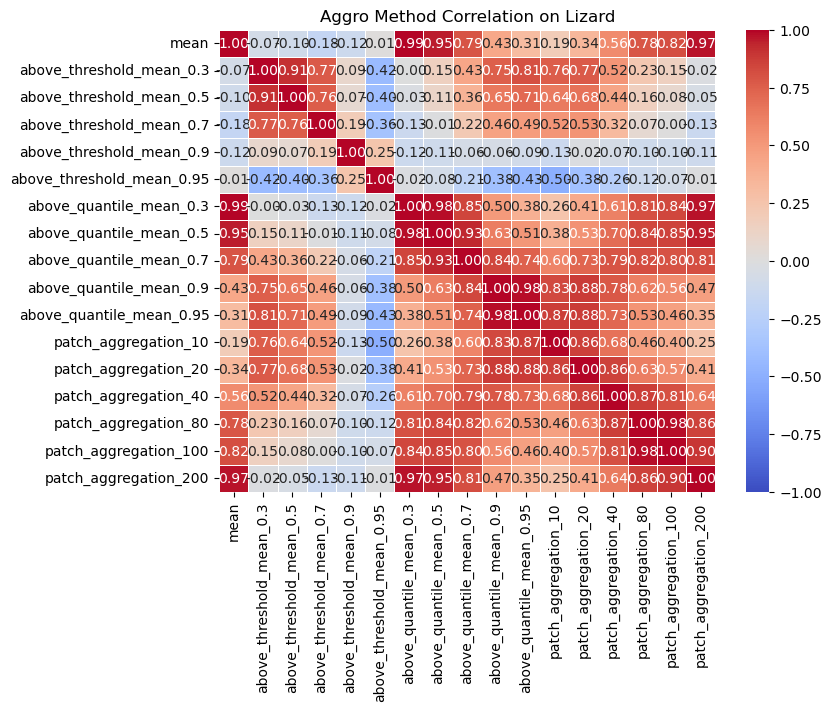

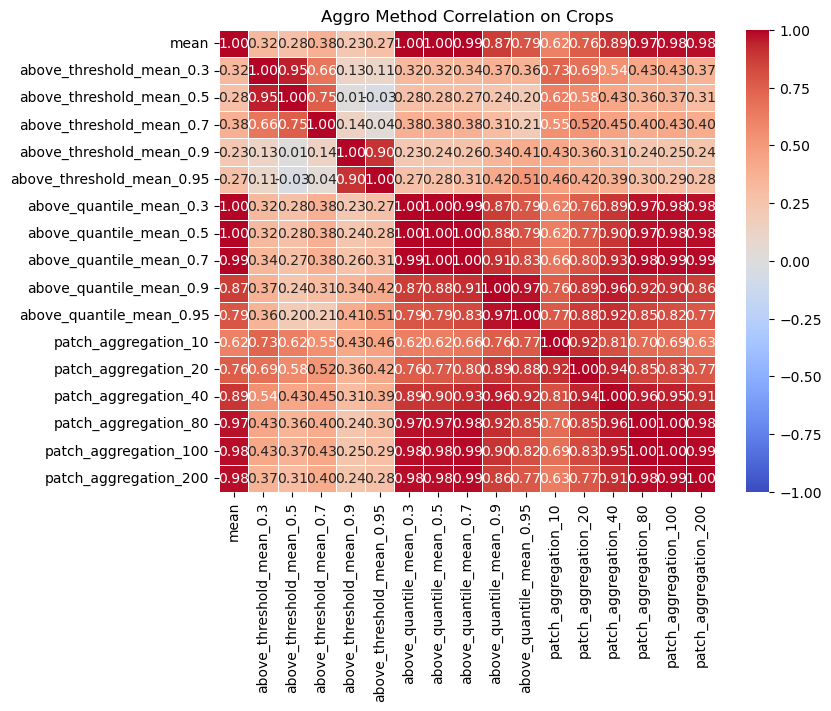

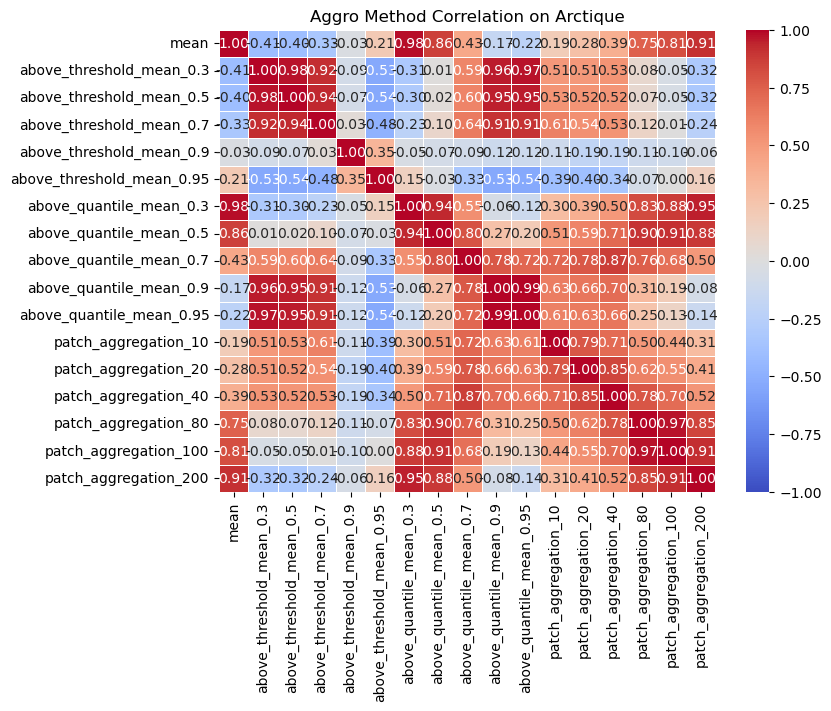

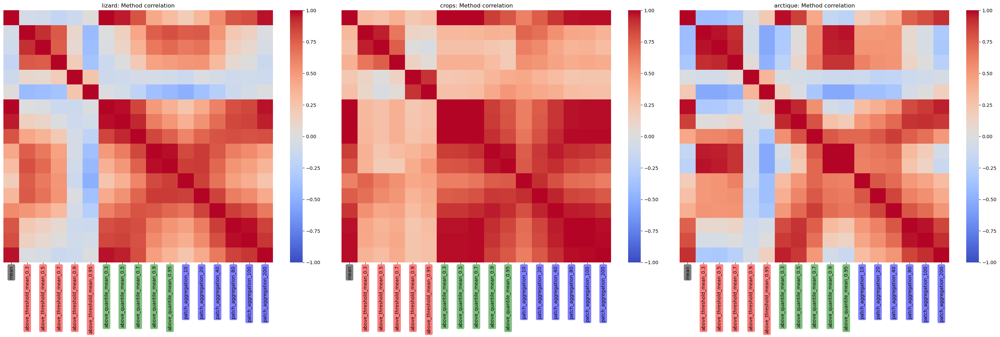

{'lizard':           0         1         2         3         4         5         6   \
 0   1.000000 -0.074667 -0.097926 -0.177955 -0.124440  0.009262  0.994260   
 1  -0.074667  1.000000  0.912752  0.771011  0.088424 -0.424351 -0.001592   
 2  -0.097926  0.912752  1.000000  0.764190  0.069689 -0.403156 -0.030064   
 3  -0.177955  0.771011  0.764190  1.000000  0.194953 -0.360351 -0.129865   
 4  -0.124440  0.088424  0.069689  0.194953  1.000000  0.249091 -0.124207   
 5   0.009262 -0.424351 -0.403156 -0.360351  0.249091  1.000000 -0.020130   
 6   0.994260 -0.001592 -0.030064 -0.129865 -0.124207 -0.020130  1.000000   
 7   0.954321  0.152843  0.112719 -0.010569 -0.105918 -0.081944  0.979542   
 8   0.794228  0.431316  0.364795  0.215750 -0.064332 -0.205021  0.845532   
 9   0.427195  0.752873  0.651482  0.460856 -0.059442 -0.384188  0.496165   
 10  0.306999  0.809270  0.713797  0.487649 -0.092230 -0.432988  0.377225   
 11  0.192795  0.760365  0.640702  0.518871 -0.127147 -0.502000  0

In [21]:
focus_strategy_list = [
    (am.mean, None),
    (am.above_threshold_mean, 0.3),
    (am.above_threshold_mean, 0.5),
    (am.above_threshold_mean, 0.7),
    (am.above_threshold_mean, 0.9),
    (am.above_threshold_mean, 0.95),
    (am.above_quantile_mean, 0.3),
    (am.above_quantile_mean, 0.5),
    (am.above_quantile_mean, 0.7),
    (am.above_quantile_mean, 0.9),
    (am.above_quantile_mean, 0.95),
    (am.patch_aggregation, 10), 
    (am.patch_aggregation, 20),
    (am.patch_aggregation, 40),
    (am.patch_aggregation, 80),
    (am.patch_aggregation, 100),
    (am.patch_aggregation, 200),
]


# Get lizard dataset
lizard_arrays, lizard_filenames = get_lizard_arrays("au")
lizard_maps = [UncertaintyMap(array=array, mask=None, name=name) for array, name in zip(lizard_arrays, lizard_filenames)]
lizard_summary = AggregationSummary(focus_strategy_list, name=f"lizard_overview", num_cpus=12)
lizard_df = lizard_summary.apply_methods(lizard_maps, save_to_excel=False, do_plot=False, max_value=1.0)

# Get crops dataset
crops_arrays, crops_filenames = get_crops_arrays()
crops_maps = [UncertaintyMap(array=array, mask=None, name=name) for array, name in zip(crops_arrays, crops_filenames)]
crops_summary = AggregationSummary(focus_strategy_list, name=f"lizard_overview", num_cpus=12)
crops_df = crops_summary.apply_methods(crops_maps, save_to_excel=False, do_plot=False, max_value=1.0)

# Get arctique dataset
arctique_arrays, arctique_filenames = get_arctique_arrays("au")
arctique_maps = [UncertaintyMap(array=array, mask=None, name=name) for array, name in zip(arctique_arrays, arctique_filenames)]
arctique_summary = AggregationSummary(focus_strategy_list, name=f"actique_overview", num_cpus=12)
arctique_df = arctique_summary.apply_methods(arctique_maps, save_to_excel=False, do_plot=False, max_value=1.0)

lizard_matrix = plot_correlation_matrix(lizard_df, "Aggro Method Correlation on Lizard")
crop_matrix = plot_correlation_matrix(crops_df, "Aggro Method Correlation on Crops")
arctique_matrix = plot_correlation_matrix(arctique_df, "Aggro Method Correlation on Arctique")

summary_dfs = {"lizard": lizard_df, "crops": crops_df, "arctique": arctique_df}
plot_correlations(summary_dfs, colorbox=True)

# FIGURES

In [ ]:
def correlation_matrix_to_excel(df, title):
    # Compute the correlation matrix (rows as methods, columns as features)
    method_columns = df.columns.tolist()[1:]
    corr_matrix = df[method_columns].T.corr(min_periods=1)
    # Change index and columns names to method_columns
    corr_matrix.columns = [strat for strat in df["Name"].tolist()]
    corr_matrix.index = [strat for strat in df["Name"].tolist()]
    # save to excel
    corr_matrix.to_excel(os.path.join("output", f"correlation_matrix_{title}.xlsx"))



In [24]:
focus_strategy_list = [
    (am.mean, None),
    (am.above_threshold_mean, 0.3),
    (am.above_threshold_mean, 0.5),
    (am.above_threshold_mean, 0.7),
    (am.above_threshold_mean, 0.9),
    (am.above_threshold_mean, 0.95),
    (am.above_quantile_mean, 0.3),
    (am.above_quantile_mean, 0.5),
    (am.above_quantile_mean, 0.7),
    (am.above_quantile_mean, 0.9),
    (am.above_quantile_mean, 0.95),
    (am.patch_aggregation, 10), 
    (am.patch_aggregation, 20),
    (am.patch_aggregation, 40),
    (am.patch_aggregation, 80),
    (am.patch_aggregation, 100),
    (am.patch_aggregation, 200),
]

# NOTE: ALll datasets use PU heatmaps across all uq_methods.
# Get lizard dataset
lizard_arrays, lizard_filenames = get_lizard_arrays()
lizard_maps = [UncertaintyMap(array=array, mask=None, name=name) for array, name in zip(lizard_arrays, lizard_filenames)]
lizard_summary = AggregationSummary(focus_strategy_list, name=f"lizard_overview", num_cpus=12)
lizard_df = lizard_summary.apply_methods(lizard_maps, save_to_excel=False, do_plot=False, max_value=1.0)

# Get crops dataset
crops_arrays, crops_filenames = get_crops_arrays()
crops_maps = [UncertaintyMap(array=array, mask=None, name=name) for array, name in zip(crops_arrays, crops_filenames)]
crops_summary = AggregationSummary(focus_strategy_list, name=f"lizard_overview", num_cpus=12)
crops_df = crops_summary.apply_methods(crops_maps, save_to_excel=False, do_plot=False, max_value=1.0)

# Get arctique dataset
arctique_arrays, arctique_filenames = get_arctique_arrays()
arctique_maps = [UncertaintyMap(array=array, mask=None, name=name) for array, name in zip(arctique_arrays, arctique_filenames)]
arctique_summary = AggregationSummary(focus_strategy_list, name=f"actique_overview", num_cpus=12)
arctique_df = arctique_summary.apply_methods(arctique_maps, save_to_excel=False, do_plot=False, max_value=1.0)


Using 8 CPUs.
Using 8 CPUs.
Using 8 CPUs.


In [96]:
correlation_matrix_to_excel(lizard_df, "lizard")
correlation_matrix_to_excel(crops_df, "crops")
correlation_matrix_to_excel(arctique_df, "arctique")


In [104]:
import random
import matplotlib.pyplot as plt

# Function to plot Lizard dataset arrays as images
def plot_arrays(arrays, n=1):
    """
    Plots the first n elements of an array list as images.
    
    :param arrays: List of NumPy arrays or similar objects.
    :param n: Number of images to display.
    """
    num_plots = min(n, len(arrays))  # Ensure we do not exceed available arrays
    fig, axes = plt.subplots(1, num_plots, figsize=(num_plots * 10, 10))

    if num_plots == 1:
        axes = [axes]  # Ensure iterable for a single subplot

    # randomize index selection for arrays
    indices = list(range(len(arrays)))
    random.shuffle(indices)
    indices = indices[:num_plots]
    for i, array in enumerate([arrays[j] for j in indices]):
        # Display the array as an image using viridis colormap
        axes[i].imshow(array, cmap='viridis')
        
        # Set title if the array has a name attribute
        if hasattr(array, "name"):
            axes[i].set_title(array.name)
        
        axes[i].set_xticks([])
        axes[i].set_yticks([])

    plt.tight_layout()
    return fig, axes


# Function to plot Lizard dataset arrays as images
def plot_array(array):
    """
    Plots the first n elements of an array list as images.
    
    :param arrays: List of NumPy arrays or similar objects.
    :param n: Number of images to display.
    """
    num_plots = 1
    # num_plots = min(n, len(arrays))  # Ensure we do not exceed available arrays
    fig, axes = plt.subplots(1, num_plots, figsize=(num_plots * 10, 10))

    if num_plots == 1:
        axes = [axes]  # Ensure iterable for a single subplot

    # # randomize index selection for arrays
    # indices = list(range(len(arrays)))
    # random.shuffle(indices)
    # indices = indices[:num_plots]
    for i, array in enumerate([array for _ in range(1)]):
        # Display the array as an image using viridis colormap
        axes[i].imshow(array, cmap='viridis')
        
        # Set title if the array has a name attribute
        if hasattr(array, "name"):
            axes[i].set_title(array.name)
        
        axes[i].set_xticks([])
        axes[i].set_yticks([])

    plt.tight_layout()
    return fig, axes


test_21_entropy.npy


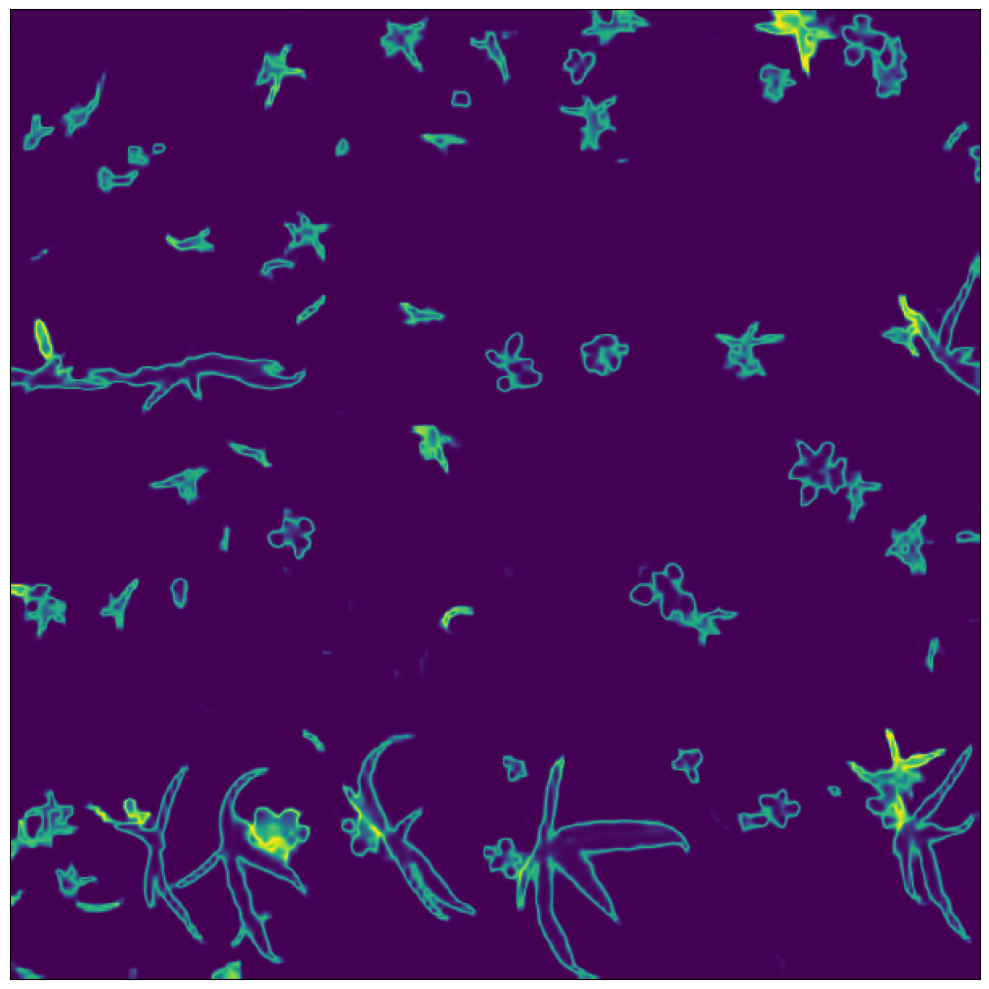

In [124]:
IDX = 20
plot_array(crops_arrays[IDX])
print(crops_filenames[IDX])

instance_noise_0_LizardData_0_00_dropout_au.npy_75


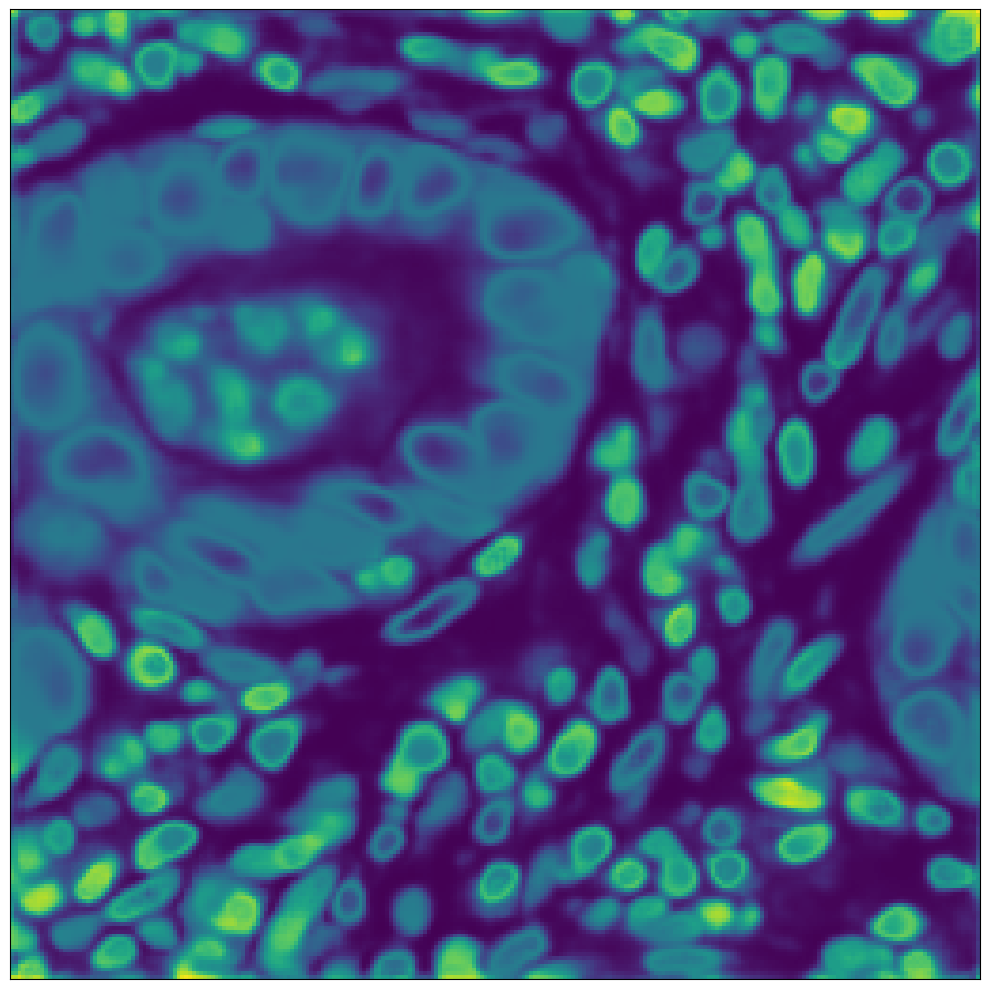

In [120]:
IDX = 75
plot_array(lizard_arrays[IDX])
print(lizard_filenames[IDX])

instance_noise_0_blood_cells_0_00_dropout_au.npy_10


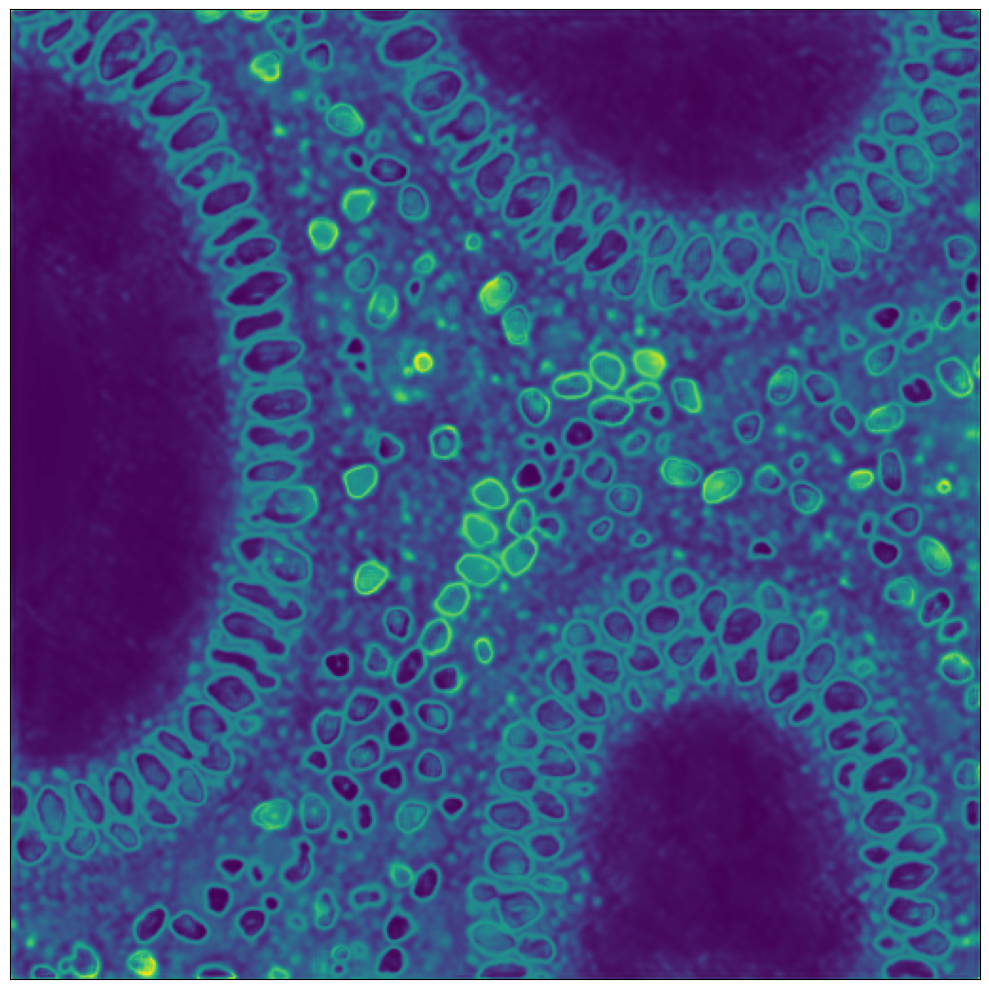

In [125]:
IDX = 10
plot_array(arctique_arrays[IDX])
print(arctique_filenames[IDX])

(<Figure size 1000x1000 with 1 Axes>, [<Axes: >])

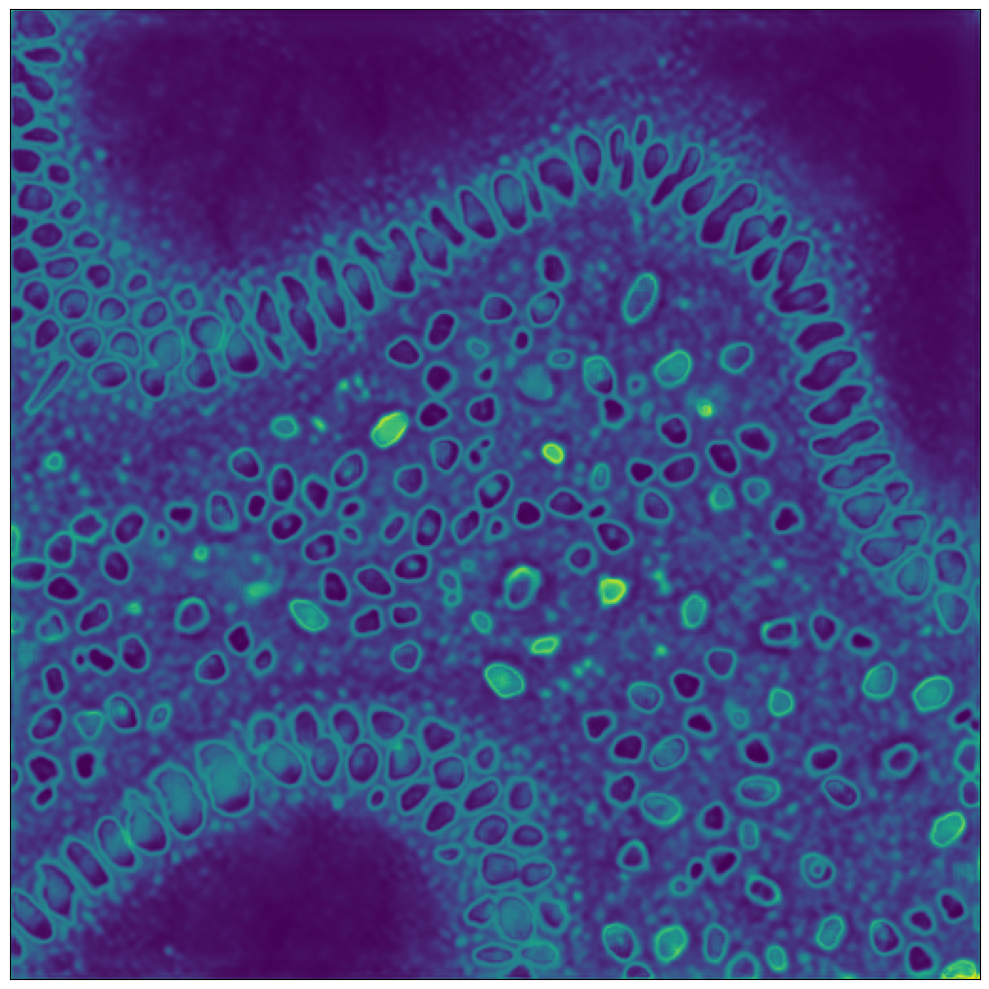

In [ ]:
IDX = 0
plot_array(arctique_arrays[IDX])
print(arctique_filenames[IDX])

In [136]:
noisy_arrs, noisy_files = get_arctique_arrays("arctique_uq_maps", uq_method="pu", task="instance", noise_level="1_00", uq_model="dropout")
id_arrs, id_files = get_arctique_arrays("arctique_uq_maps", uq_method="pu", task="instance", noise_level="0_00", uq_model="dropout")


(<Figure size 1000x1000 with 1 Axes>, [<Axes: >])

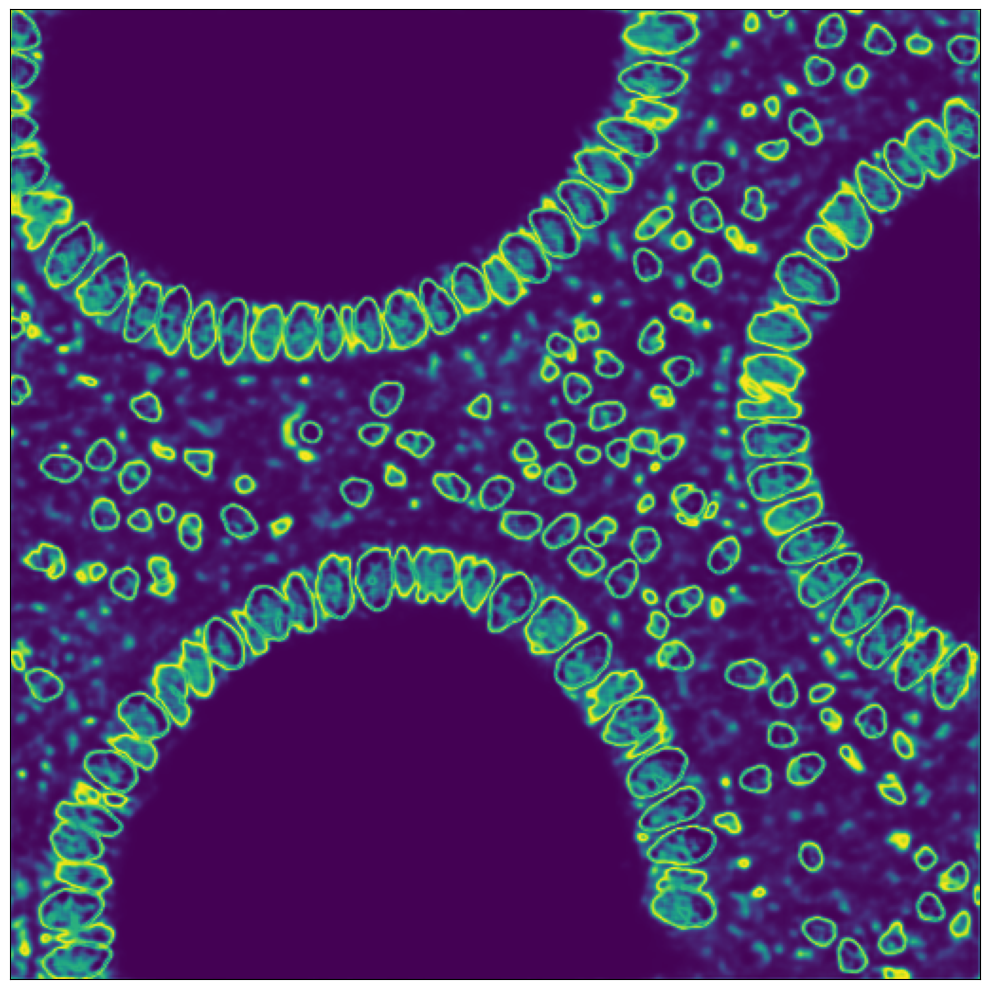

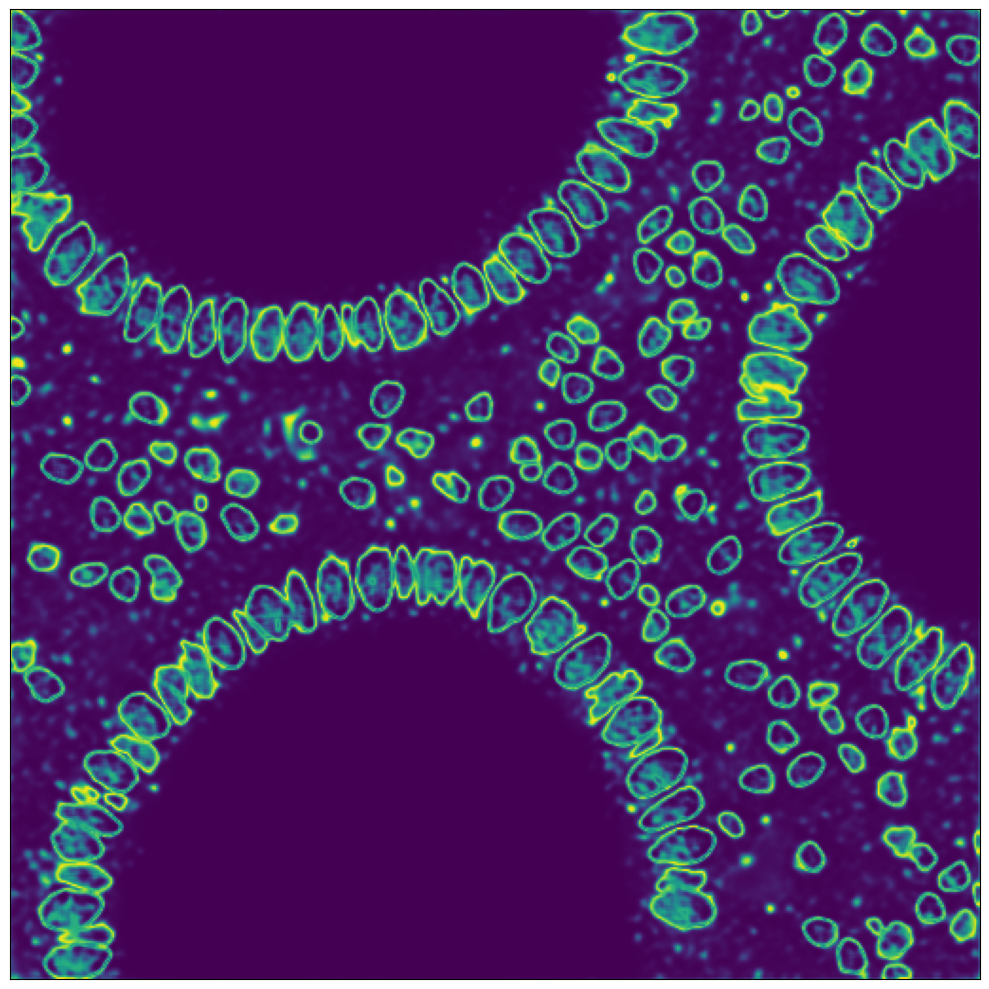

In [138]:
IDX = 5
plot_array(noisy_arrs[IDX])
plot_array(id_arrs[IDX])

In [145]:
def get_arctique_patch_arrays(dir, uq_method="pu", task="semantic", noise="blood_cells", noise_level="0_00", uq_model="dropout"):
    # Load arrays
    path = os.path.join(os.getcwd(), "..", "..", "data", dir)
    files = os.listdir(path)
    # Filter files by UQ method and segmentation task and noise level
    def norm_factor(file, task):
        if "softmax" in file:
            return 1
        return 1 / np.log(6) if task == "semantic" else 1 / np.log(3)
    def filter(file):
        return uq_method in file and task in file and noise_level in file and uq_model in file and noise in file
    arrays = [np.load(os.path.join(path, file))*norm_factor(file, task) for file in files if filter(file)] # 3D arrays, shape (50,512,512)
    # num_slices = arrays[0].shape[0]
    # arrays = [array[slice,:,:] for array in arrays for slice in range(num_slices)]
    arrays = [np.where(array < 0, 0, array) for array in arrays]
    # # Uniformly scale by ln(K) where K is number of classes
    # # 6 for Arctique: Background, LYM, PLA, EPI, EOS, FIB 
    # if task == "semantic":
    #     arrays /= np.log(6)
    # else:
    #     arrays /= np.log(3)
    #files = [f"{file}_{slice}" for file in files for slice in range(num_slices)]
    return arrays, files

In [ ]:
models = ["dropout", "ensemble", "tta", "softmax"]
arrays_by_model = {}
moran_values_by_model = {}
for model in models:
    arrs, files = get_arctique_patch_arrays("arctique_uq_maps_patches", uq_model=model)
    morans = [am.morans_I(UncertaintyMap(array=arr, mask=None, name="")) for arr in arrs]
    arrays_by_model[model] = arrs
    moran_values_by_model[model] = morans


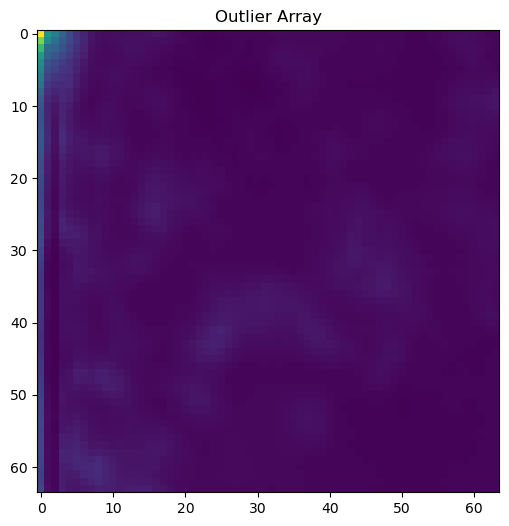

0.7231242313769516

In [156]:
def get_min_value(A, B):

    # Find the index of the minimum value in A
    min_index = np.argmin(A)

    # Get the corresponding value from B
    min_B_value = B[min_index]
    return min_B_value

outlier = get_min_value(moran_values_by_model["softmax"], arrays_by_model["softmax"])

# plot outlier array
plt.figure(figsize=(8, 6))
plt.imshow(outlier, cmap="viridis")
plt.title("Outlier Array")
plt.show()

am.morans_I(UncertaintyMap(array=outlier, mask=None, name=""))

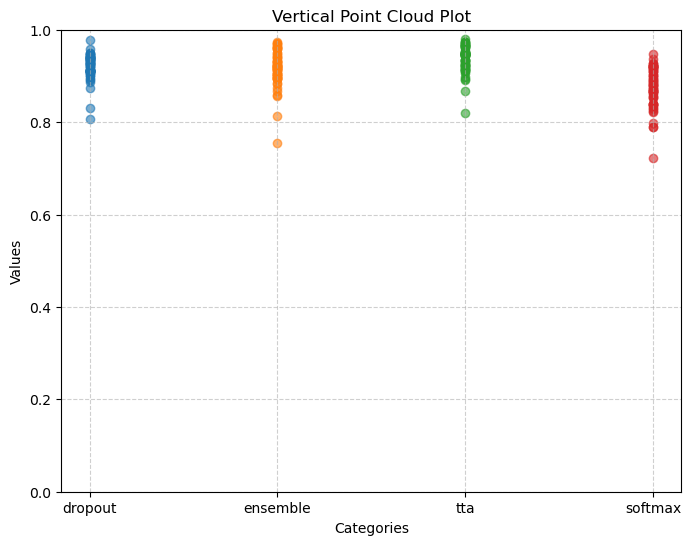

In [157]:
import numpy as np
import matplotlib.pyplot as plt

# Example dictionary with 4 keys, each containing a list of 100 numbers
# data_dict = {
#     "A": np.random.randn(100),
#     "B": np.random.randn(100) + 2,
#     "C": np.random.randn(100) - 1,
#     "D": np.random.randn(100) + 1,
# }

data_dict = moran_values_by_model

# Extract keys and values
keys = list(data_dict.keys())
values = [data_dict[key] for key in keys]

# Create x positions for each key
x_positions = np.arange(len(keys))

# Create the point cloud plot
plt.figure(figsize=(8, 6))

for i, (x, val) in enumerate(zip(x_positions, values)):
    plt.scatter(np.full_like(val, x), val, alpha=0.6, label=keys[i])

# Labeling
plt.xticks(x_positions, keys)
plt.xlabel("Categories")
plt.ylabel("Values")
plt.title("Vertical Point Cloud Plot")
plt.ylim(0,1)

plt.grid(True, linestyle="--", alpha=0.6)
plt.show()
